In [11]:
import os
import time
import base64
from IPython.display import display, Javascript
from google.colab import output

# Function to capture and upload frames
def capture_and_upload(num_frames=60, duration=10):
    """Captures frames from webcam and uploads them."""

    js_code = f"""
        const start_time = Date.now();
        const end_time = start_time + {duration} * 1000;
        let count = 0;

        async function captureFrame() {{
            try {{
                const stream = await navigator.mediaDevices.getUserMedia({{ video: true }});
                const video = document.createElement('video');
                video.srcObject = stream;
                video.play();

                const canvas = document.createElement('canvas');
                const ctx = canvas.getContext('2d');

                video.onloadedmetadata = () => {{
                    canvas.width = video.videoWidth;
                    canvas.height = video.videoHeight;

                    const captureInterval = setInterval(() => {{
                        if (Date.now() > end_time || count >= {num_frames}) {{
                            clearInterval(captureInterval);
                            stream.getTracks().forEach(track => track.stop());
                            return;
                        }}

                        ctx.drawImage(video, 0, 0, canvas.width, canvas.height);
                        const dataURL = canvas.toDataURL('image/jpeg', 0.8);

                        const blob = dataURLtoBlob(dataURL);
                        const filename = `frame_${{count}}.jpeg`;

                        uploadFile(blob, filename).then(() => count++);
                    }}, 1000 / ({num_frames} / {duration}));
                }};
            }} catch (error) {{
                console.error("Error accessing camera:", error);
                alert("Could not access the webcam. Ensure permissions are granted.");
            }}
        }}

        function dataURLtoBlob(dataURL) {{
            const [meta, base64] = dataURL.split(';base64,');
            const contentType = meta.split(':')[1];
            const byteString = atob(base64);
            const ab = new ArrayBuffer(byteString.length);
            const ia = new Uint8Array(ab);
            for (let i = 0; i < byteString.length; i++) {{
                ia[i] = byteString.charCodeAt(i);
            }}
            return new Blob([ab], {{ type: contentType }});
        }}

        async function uploadFile(blob, filename) {{
            const reader = new FileReader();
            reader.readAsDataURL(blob);
            reader.onloadend = async () => {{
                const base64String = reader.result.split(',')[1];
                await google.colab.kernel.invokeFunction('upload_to_google', [base64String, filename]);
            }};
        }}

        captureFrame();
    """

    display(Javascript(js_code))
    time.sleep(duration + 2)
    print("Finished capturing frames.")

# Backend function to save uploaded files
def upload_to_google(base64_string, filename):
    output_folder = "processed_images"
    os.makedirs(output_folder, exist_ok=True)
    decoded_image = base64.b64decode(base64_string)
    output_path = os.path.join(output_folder, filename)
    with open(output_path, 'wb') as f:
        f.write(decoded_image)
    print(f"Saved: {output_path}")
    return True

# Register callback
output.register_callback('upload_to_google', upload_to_google)

# Create output folder
os.makedirs("processed_images", exist_ok=True)

# Example: Capture 60 frames in 10 seconds
capture_and_upload(num_frames=60, duration=10)


<IPython.core.display.Javascript object>

Finished capturing frames.
Saved: processed_images/frame_0.jpeg
Saved: processed_images/frame_1.jpeg
Saved: processed_images/frame_2.jpeg
Saved: processed_images/frame_3.jpeg
Saved: processed_images/frame_4.jpeg
Saved: processed_images/frame_5.jpeg
Saved: processed_images/frame_6.jpeg
Saved: processed_images/frame_7.jpeg
Saved: processed_images/frame_8.jpeg
Saved: processed_images/frame_9.jpeg
Saved: processed_images/frame_10.jpeg
Saved: processed_images/frame_11.jpeg
Saved: processed_images/frame_12.jpeg
Saved: processed_images/frame_13.jpeg
Saved: processed_images/frame_14.jpeg
Saved: processed_images/frame_15.jpeg
Saved: processed_images/frame_16.jpeg
Saved: processed_images/frame_17.jpeg
Saved: processed_images/frame_18.jpeg
Saved: processed_images/frame_19.jpeg
Saved: processed_images/frame_20.jpeg
Saved: processed_images/frame_21.jpeg
Saved: processed_images/frame_22.jpeg
Saved: processed_images/frame_23.jpeg
Saved: processed_images/frame_24.jpeg
Saved: processed_images/frame_25.

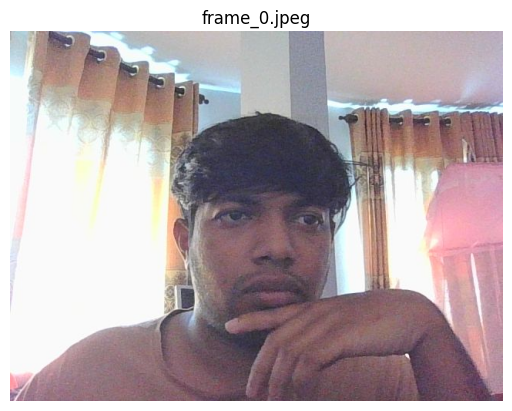

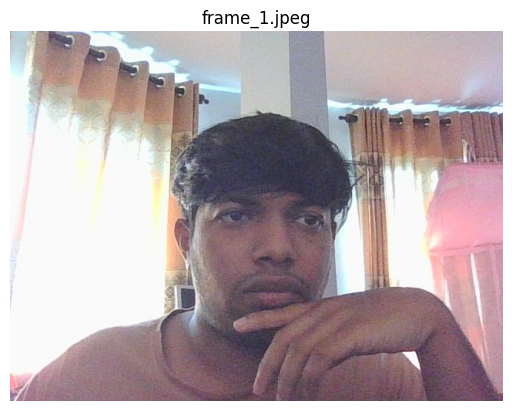

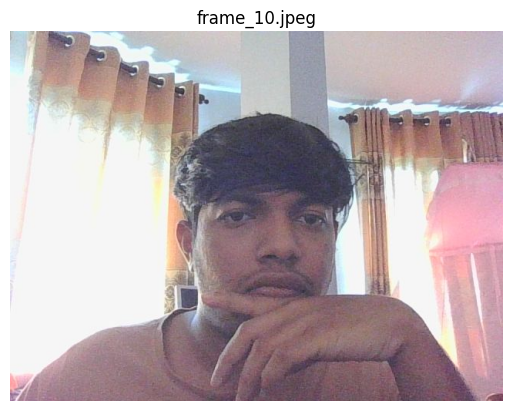

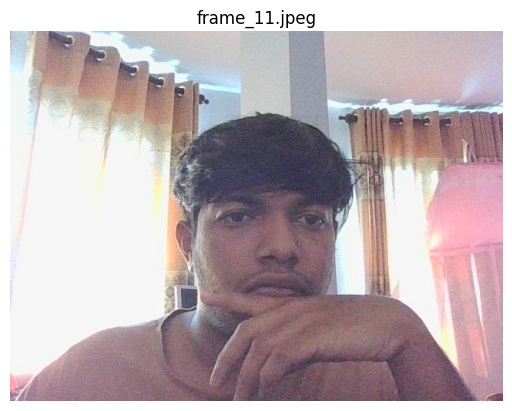

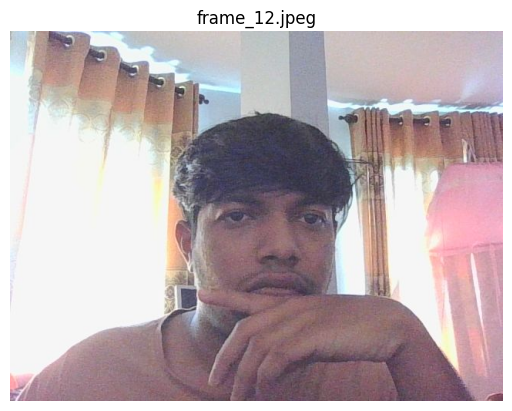

...

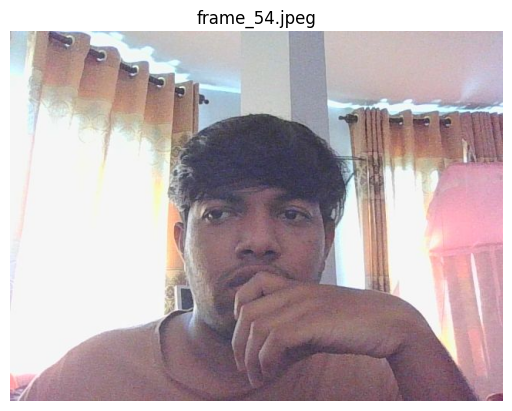

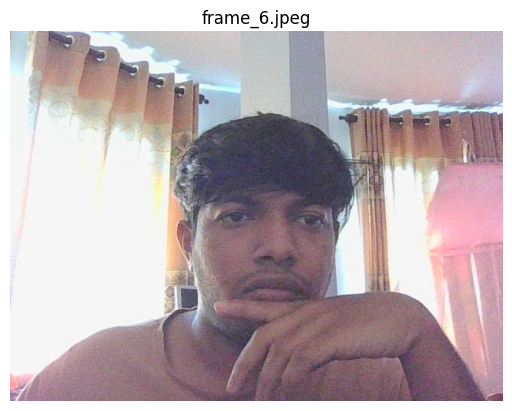

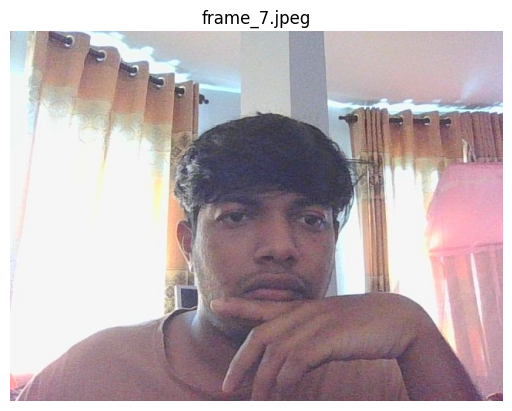

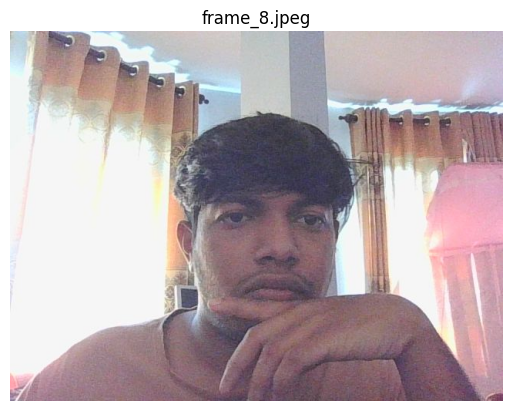

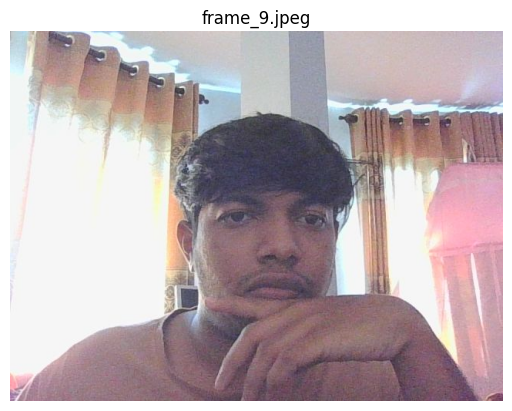

In [12]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to the folder containing captured images
output_folder = "processed_images"

# List all files in the output folder
image_files = sorted([f for f in os.listdir(output_folder) if f.endswith('.jpeg')])

# Display each image
for image_file in image_files:
    image_path = os.path.join(output_folder, image_file)
    img = Image.open(image_path)

    # Display the image
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_file)
    plt.show()
